In [1]:
import gdown
import numpy as np
from pydub import AudioSegment

C:\Users\moham\AppData\Roaming\Python\Python36\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
# Uncomment for downloading LibriSpeech and ESC-50-master

# # All clean speech files in clean_speech folder
# for root,dir,files in os.walk("LibriSpeech/dev-clean/"):
#   for file in files:
#     if file.endswith(".flac"):
#       path_file = os.path.join(root,file)
#       shutil.copy2(path_file,"clean_speech")


# # All noise audio files in noise folder
# for root,dir,files in os.walk("ESC-50-master/audio/"):
#   for file in files:
#     if file.endswith(".wav"):
#       path_file = os.path.join(root,file)
#       shutil.copy2(path_file,"noise")

### Extract STFT features from the audio

In [3]:
from utils.utils import create_data

Segmentation Models: using `keras` framework.


In [4]:
from parameters.configs import Config

# Define configuration parameters
sample_rate = 8000  # 8KHz
min_duration = 1.0  # 1 sec
frame_length = 8064
hop_length_frame = 8064  # overlap
hop_length_frame_noise = 5000  # overlap of noise
nb_samples = 1000
n_fft = 255
hop_length_fft = 63
dim_square_spec = int(n_fft / 2) + 1

# Create a config object
config = Config(sample_rate, min_duration, frame_length, hop_length_frame, hop_length_frame_noise, nb_samples, n_fft, hop_length_fft, dim_square_spec)

In [5]:
# Set the necessary parameters
noise_dir="noise/"
voice_dir="clean_speech/"
path_save_spectrogram="spectogram/"


create_data(noise_dir=noise_dir,voice_dir=voice_dir,
            path_save_spectrogram=path_save_spectrogram,
            sample_rate=sample_rate,min_duration=min_duration,frame_length=frame_length,hop_length_frame=hop_length_frame,hop_length_frame_noise=hop_length_frame_noise,nb_samples=nb_samples,n_fft=n_fft,hop_length_fft=hop_length_fft)

In [6]:
# Loading noisy voice and voice spectograms
noisy_voice_amp_db = np.load('spectogram/noisy_voice_amp_db.npy')
print(np.shape(noisy_voice_amp_db))

(1000, 128, 128)


## U-net implementation

In [7]:
import numpy as np

noisy_voice = np.load("spectogram/noisy_voice_amp_db.npy")
voice = np.load("spectogram/voice_amp_db.npy")
noise = noisy_voice-voice

# Shape of noisy voice data
print(noisy_voice.shape)
# Shape of noise data
print(noise.shape)

(1000, 128, 128)
(1000, 128, 128)


In [34]:
# Reshape the input and the output data to 1-dimensional tensor for training process

# Input
noisy_voice = noisy_voice[:,:,:]
noisy_voice = noisy_voice.reshape(noisy_voice.shape[0],noisy_voice.shape[1],noisy_voice.shape[2],1)

# Output
noise = noise[:,:,:]
noise = noise.reshape(noise.shape[0],noise.shape[1],noise.shape[2],1)

# Shapes after reshaping
print(noisy_voice.shape)
print(noise.shape)

(1000, 128, 128, 1)
(1000, 128, 128, 1)


DescribeResult(nobs=16384000, minmax=(array([-80.]), array([0.])), mean=array([-45.54806118]), variance=array([303.03816463]), skewness=array([-0.1870061]), kurtosis=array([-0.4934143]))
DescribeResult(nobs=16384000, minmax=(array([-64.85073092]), array([80.])), mean=array([7.39474223]), variance=array([177.26622833]), skewness=array([1.38368989]), kurtosis=array([1.75146264]))
(1000, 128, 128)
(1000, 128, 128)
DescribeResult(nobs=16384000, minmax=(array([-0.68]), array([0.92])), mean=array([0.00903878]), variance=array([0.12121527]), skewness=array([-0.1870061]), kurtosis=array([-0.4934143]))
DescribeResult(nobs=16384000, minmax=(array([-0.8640333]), array([0.90243902])), mean=array([0.01700905]), variance=array([0.02636321]), skewness=array([1.38368989]), kurtosis=array([1.75146264]))
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to         

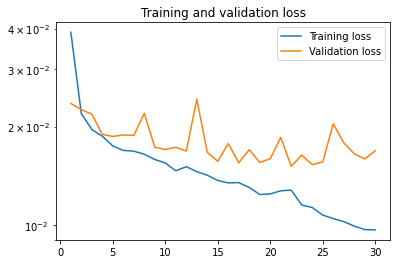

In [35]:
from utils.utils import training_unet
training_unet(path_save_spectrogram, 'weights', epochs= 30, batch_size=20)

## ResNet101 Pre-trained model Encoder for Segmentation

In [36]:
# Installing the Segmentation Library
# !pip install git+https://github.com/qubvel/segmentation_models

DescribeResult(nobs=16384000, minmax=(array([-80.]), array([0.])), mean=array([-45.54806118]), variance=array([303.03816463]), skewness=array([-0.1870061]), kurtosis=array([-0.4934143]))
DescribeResult(nobs=16384000, minmax=(array([-64.85073092]), array([80.])), mean=array([7.39474223]), variance=array([177.26622833]), skewness=array([1.38368989]), kurtosis=array([1.75146264]))
(1000, 128, 128)
(1000, 128, 128)
DescribeResult(nobs=16384000, minmax=(array([-0.68]), array([0.92])), mean=array([0.00903878]), variance=array([0.12121527]), skewness=array([-0.1870061]), kurtosis=array([-0.4934143]))
DescribeResult(nobs=16384000, minmax=(array([-0.8640333]), array([0.90243902])), mean=array([0.01700905]), variance=array([0.02636321]), skewness=array([1.38368989]), kurtosis=array([1.75146264]))
Epoch 1/30
45/45 [==============================] - 122s 3s/step - loss: 0.0815 - mae: 0.2445 - val_loss: 0.0282 - val_mae: 0.1227

Epoch 00001: val_loss improved from inf to 0.02815, saving model to we

c:\ProgramData\anaconda3\envs\gpu\lib\site-packages\keras\utils\generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/30
45/45 [==============================] - 121s 3s/step - loss: 0.0249 - mae: 0.1353 - val_loss: 0.0314 - val_mae: 0.1315

Epoch 00002: val_loss did not improve from 0.02815
Epoch 3/30
45/45 [==============================] - 122s 3s/step - loss: 0.0213 - mae: 0.1218 - val_loss: 0.0420 - val_mae: 0.1793

Epoch 00003: val_loss did not improve from 0.02815
Epoch 4/30
45/45 [==============================] - 122s 3s/step - loss: 0.0198 - mae: 0.1162 - val_loss: 0.0303 - val_mae: 0.1439

Epoch 00004: val_loss did not improve from 0.02815
Epoch 5/30
45/45 [==============================] - 122s 3s/step - loss: 0.0189 - mae: 0.1130 - val_loss: 0.0282 - val_mae: 0.1270

Epoch 00005: val_loss did not improve from 0.02815
Epoch 6/30
45/45 [==============================] - 123s 3s/step - loss: 0.0176 - mae: 0.1086 - val_loss: 0.0282 - val_mae: 0.1282

Epoch 00006: val_loss did not improve from 0.02815
Epoch 7/30
45/45 [==============================] - 121s 3s/step - loss: 0.0170 - mae

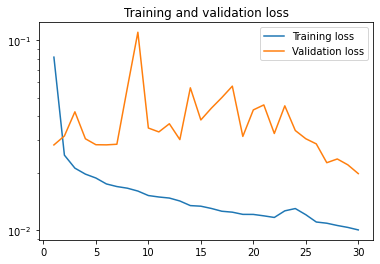

In [37]:
from utils.utils import training_unetRes
training_unetRes(path_save_spectrogram, 'weights', epochs= 30, batch_size=20)

## Prediction

In [38]:
from utils.utils import prediction

### Several background noise denoising

In [39]:
url = 'https://drive.google.com/uc?id=1dNs_LqsPFY3R4lMBMfejHFJAn4zfsbtK'
output = 'Final_Output_Noisy_Audio_Sample_Roshan (1).wav'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1dNs_LqsPFY3R4lMBMfejHFJAn4zfsbtK
To: c:\Users\moham\Desktop\Hance\Task\Final_Output_Noisy_Audio_Sample_Roshan (1).wav
100%|██████████| 1.16M/1.16M [00:00<00:00, 6.61MB/s]


'Final_Output_Noisy_Audio_Sample_Roshan (1).wav'

In [40]:
#Playing the Noisy audio sample1
from IPython.display import Audio
Audio('Final_Output_Noisy_Audio_Sample_Roshan (1).wav')

In [41]:

import numpy as np
prediction('weights', '', '', ['Final_Output_Noisy_Audio_Sample_Roshan (1).wav'],'denoise_audio.wav', config)

Loaded model from disk
128
(26, 128, 128)
(26, 128, 128)
8064
63


In [42]:
# Boosting volume of the audio
song = AudioSegment.from_wav("denoise_audio.wav")
louder_song = song+10
louder_song.export("louder_denoise_audio.wav", format="wav")

<_io.BufferedRandom name='louder_denoise_audio.wav'>

In [43]:
#Playing the Denoised audio
from IPython.display import Audio
Audio('louder_denoise_audio.wav')

### Animal Denoising

In [44]:
url = 'https://drive.google.com/uc?id=1MsVGoIFR7350Hdeh3sJdqSzMsKuVoD-0'
output = 'Dog Noisy.mp3'  # The name you want to save the file as

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1MsVGoIFR7350Hdeh3sJdqSzMsKuVoD-0
To: c:\Users\moham\Desktop\Hance\Task\Dog Noisy.mp3
100%|██████████| 57.3k/57.3k [00:00<00:00, 1.80MB/s]


'Dog Noisy.mp3'

In [45]:
#Playing the Noisy audio sample2
from IPython.display import Audio
Audio('Dog Noisy.mp3')

In [46]:
prediction('weights', '', '', ['Dog Noisy.mp3'], 'denoise_audio_dog.wav', config)

Loaded model from disk
128
(3, 128, 128)
(3, 128, 128)
8064
63


In [47]:
song = AudioSegment.from_wav("denoise_audio_dog.wav")
louder_song = song+10
louder_song.export("louder_denoise_audio_dog.wav", format="wav")

<_io.BufferedRandom name='louder_denoise_audio_dog.wav'>

In [48]:
#Playing the Denoised audio
from IPython.display import Audio
Audio('louder_denoise_audio_dog.wav')

### Street audio denoising
###### Source of audios: 'https://github.com/alexander-prutko/mil-audio-denoising/tree/main/audio'

In [49]:
url = 'https://drive.google.com/uc?id=1xq4Yl_BvkCYXKKKXd7P5JwW9GPiLyK5r'
output = 'audio_ex_01_80.wav'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1xq4Yl_BvkCYXKKKXd7P5JwW9GPiLyK5r
To: c:\Users\moham\Desktop\Hance\Task\audio_ex_01_80.wav
100%|██████████| 380k/380k [00:00<00:00, 3.31MB/s]


'audio_ex_01_80.wav'

In [50]:
url = 'https://drive.google.com/uc?id=1XOzV_TyLkFl79QQM5MPrPZg1--cn0lA9'
output = 'audio_ex_street.wav' 

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1XOzV_TyLkFl79QQM5MPrPZg1--cn0lA9
To: c:\Users\moham\Desktop\Hance\Task\audio_ex_street.wav
100%|██████████| 380k/380k [00:00<00:00, 3.68MB/s]


'audio_ex_street.wav'

In [51]:
url = 'https://drive.google.com/uc?id=16zI4lqsGuGgrAiOUQR-Caau_Qn8gvxPY'
output = 'audio_out_01.wav' 

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=16zI4lqsGuGgrAiOUQR-Caau_Qn8gvxPY
To: c:\Users\moham\Desktop\Hance\Task\audio_out_01.wav
100%|██████████| 378k/378k [00:00<00:00, 3.35MB/s]


'audio_out_01.wav'

In [52]:
url = 'https://drive.google.com/uc?id=1rvacwhsnOknQclhfTqbmj5NwuKL7qDtg'
output = 'audio_out_street.wav'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1rvacwhsnOknQclhfTqbmj5NwuKL7qDtg
To: c:\Users\moham\Desktop\Hance\Task\audio_out_street.wav
100%|██████████| 378k/378k [00:00<00:00, 3.88MB/s]


'audio_out_street.wav'

In [53]:
#Playing the audio_ex_01_80.wav
from IPython.display import Audio
Audio('audio_ex_01_80.wav')

In [54]:
prediction('weights', '', '', ['audio_ex_01_80.wav'],'denoise_ex_01_80.wav', config)

Loaded model from disk
128
(3, 128, 128)
(3, 128, 128)
8064
63


In [55]:
#Playing the Denoised audio
from IPython.display import Audio
Audio('denoise_ex_01_80.wav')

### Music denoising

In [56]:
url = 'https://drive.google.com/uc?id=1EKE_uy5ZKBOSYJ72ZjRsxhUmAuQLDcvx'
output = 'I like me.wav'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1EKE_uy5ZKBOSYJ72ZjRsxhUmAuQLDcvx
To: c:\Users\moham\Desktop\Hance\Task\I like me.wav
100%|██████████| 10.8M/10.8M [00:01<00:00, 10.6MB/s]


'I like me.wav'

In [57]:
from IPython.display import Audio
Audio('I like me.wav')

In [58]:
prediction('weights', '', '', ['I like me.wav'],'denoised_ilikeme.wav', config)

Loaded model from disk
128
(60, 128, 128)
(60, 128, 128)
8064
63


In [59]:
#Playing the Denoised audio
from IPython.display import Audio
Audio('denoised_ilikeme.wav')

## DeeplabsV3

In [60]:
url = 'https://drive.google.com/uc?id=1OTq7eT2HZoyTsWjJ3SCl8dnxRu0aj2-y'
output = 'model_deep_encoded.h5'
gdown.download(url, output, quiet=False)


url = 'https://drive.google.com/uc?id=1AC1U5jDl3qNAQpfseRoja9XdzfZd4Z5z'
output = 'model_deep_encoded.json'
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1OTq7eT2HZoyTsWjJ3SCl8dnxRu0aj2-y
From (redirected): https://drive.google.com/uc?id=1OTq7eT2HZoyTsWjJ3SCl8dnxRu0aj2-y&confirm=t&uuid=af84acd5-be00-4524-991f-78476ccd6d79
To: c:\Users\moham\Desktop\Hance\Task\model_deep_encoded.h5
100%|██████████| 143M/143M [00:12<00:00, 11.3MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1AC1U5jDl3qNAQpfseRoja9XdzfZd4Z5z
To: c:\Users\moham\Desktop\Hance\Task\model_deep_encoded.json
100%|██████████| 82.4k/82.4k [00:00<00:00, 2.01MB/s]


'model_deep_encoded.json'

In [61]:
from keras.models import load_model

model = load_model('model_deep_encoded.h5')
model.save('model_deep_encoded.keras')

In [62]:

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import model_from_json
import soundfile as sf
from utils.utils import prediction_deeplab

In [63]:
prediction_deeplab('weights', '', '', ['Final_Output_Noisy_Audio_Sample_Roshan (1).wav'],'denoise_audio_deeplab.wav', config)

Loaded model from disk
128
(26, 128, 128)
(26, 128, 128)
8064
63


In [64]:
#Playing the Denoised audio
from IPython.display import Audio
Audio('denoise_audio_deeplab.wav')